##**Obtenção das bases de imagens:**
*Baixar as imagens de teste diretamente do github*

*Obs.: Desta forma as imagens ficarão disponíveis somente enquanto esta sessão permanecer ativa ou até que o usuário  clique em no menu: Runtime>Factory reset runtime*

In [ ]:
!git clone https://github.com/guimota-uerj/TestImages.git
!pwd
!ls

Cloning into 'TestImages'...
remote: Enumerating objects: 104, done.
remote: Total 104 (delta 0), reused 0 (delta 0), pack-reused 104
Receiving objects: 100% (104/104), 19.32 MiB | 27.02 MiB/s, done.
Resolving deltas: 100% (21/21), done.
/content
sample_data  TestImages


# **Questão 1:**

Utilizando a imagem colorida PorDoSol.tiff, implemente uma correção gama.
Utilize valores de gama acima de um e abaixo de um. Execute a correção gama nos canais R, G e B independentemente e apresente a imagem resultante. Em seguida, analise os resultados quanto aos seus efeitos qualitativos nas partes claras e escuras da imagem. Apresente também os gráficos das funções gama e os histogramas das imagens.

*Entrar na pasta da imagem de teste utilizada*

In [ ]:
%cd /content/TestImages/PorDoSol/
!ls

/content/TestImages/PorDoSol
PorDoSol.tiff  RecortePorDoSol.tiff


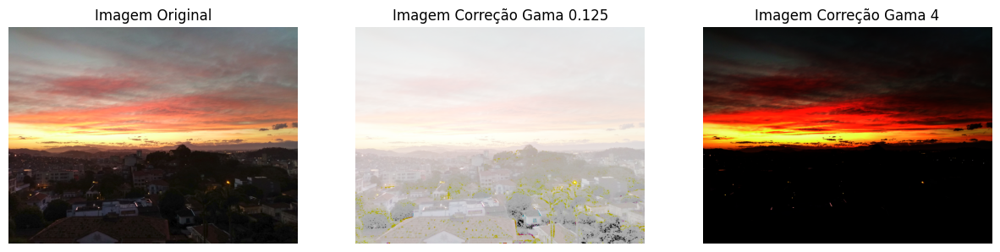

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
original = cv2.imread('PorDoSol.tiff')


plt.figure(figsize = (15,12))
plt.subplot(1,3,1)
plt.title('Imagem Original')
plt.axis('off')
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))

plt.subplot(1,3,2)
gama1 = 1/8
gama_corrected = np.uint8(((np.float32(original)/255)**gama1)*255)
plt.title('Imagem Correção Gama '+str(gama1))
plt.axis('off')
plt.imshow(cv2.cvtColor(gama_corrected, cv2.COLOR_BGR2RGB))

gama2 = 4
gama_corrected2 = np.uint8(((np.float32(original)/255)**gama2)*255)
plt.subplot(1,3,3)
plt.title('Imagem Correção Gama '+str(gama2))
plt.axis('off')
plt.imshow(cv2.cvtColor(gama_corrected2, cv2.COLOR_BGR2RGB))
plt.show()


### Análise dos canais rgb da imagem

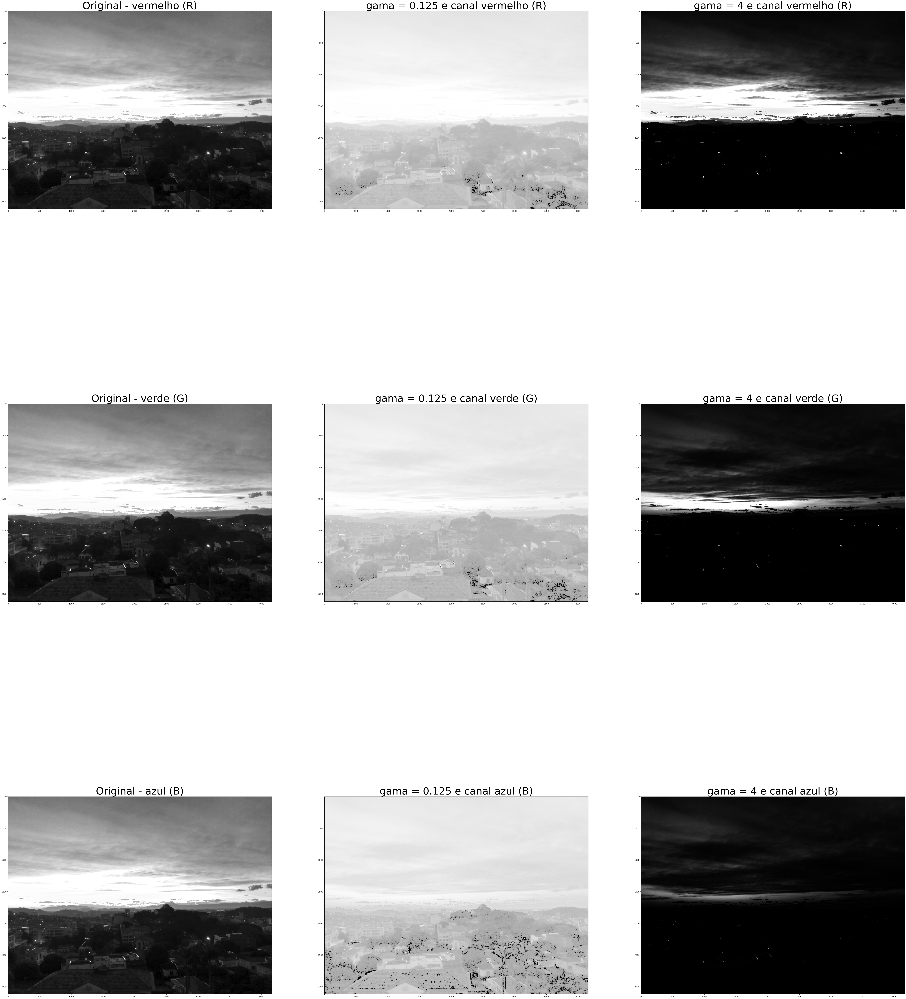

In [ ]:
#canais rgb
splitted = cv2.split(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
fig, axs = plt.subplots(3,3)
fig.set_size_inches(w=80,h=100)
canal = ['vermelho (R)','verde (G)','azul (B)']
gama_values = [(1/8),4]
imgs_corrected = []
for i in range(3):
  axs[i,0].set_title('Original - '+canal[i], fontsize=50)
  axs[i,0].axis('on')
  axs[i,0].imshow(splitted[0],cmap = 'gray')

  gama_chanel_corrected1 = np.uint8(((np.float32(splitted[i])/255)**gama_values[0])*255)
  axs[i,1].set_title('gama = 0.125 e canal '+canal[i], fontsize=50)
  axs[i,1].axis('on')
  axs[i,1].imshow(gama_chanel_corrected1,cmap = 'gray' )

  gama_chanel_corrected2 = np.uint8(((np.float32(splitted[i])/255)**gama_values[1])*255)
  axs[i,2].set_title('gama = 4 e canal '+canal[i], fontsize=50)
  axs[i,2].axis('on')
  axs[i,2].imshow(gama_chanel_corrected2,cmap = 'gray')

  imgs_corrected.append(cv2.calcHist([gama_chanel_corrected1],[0],None,[256],[0,256]))
  imgs_corrected.append(cv2.calcHist([gama_chanel_corrected2],[0],None,[256],[0,256]))
fig.show()

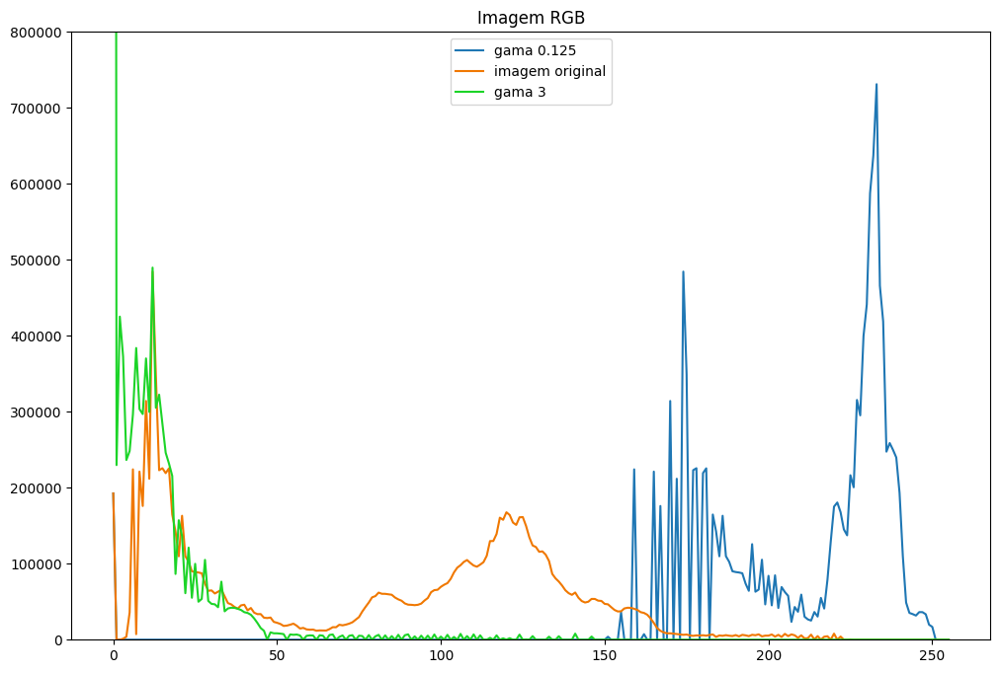

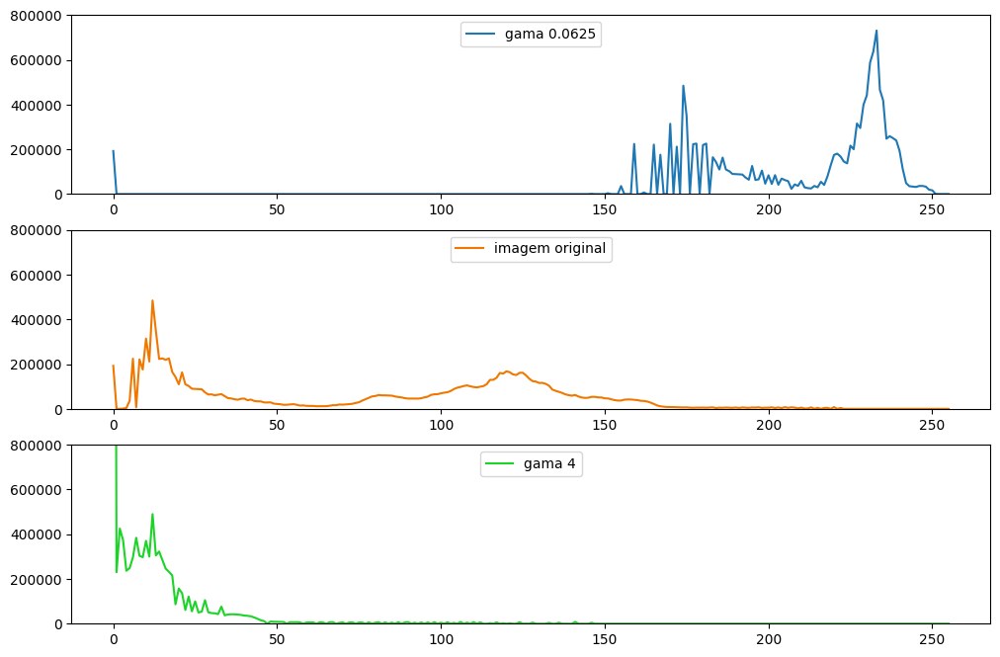

In [ ]:

histr2 = cv2.calcHist([gama_corrected],[0],None,[256],[0,256])
histr1 = cv2.calcHist([original],[0],None,[256],[0,256])
hist3 = cv2.calcHist([gama_corrected2],[0],None,[256],[0,256])

# show the plotting graph of an image
plt.figure(figsize= (12,8))
plt.title('Imagem RGB')
plt.ylim(0,8*(10**5))
plt.plot(histr2, label = 'gama 0.125')
plt.plot(histr1, label = 'imagem original', color = '#f07800')
plt.plot(hist3, label = 'gama 3', color = '#1cd428')
plt.legend(loc='upper center')

plt.figure(num = 123,figsize = (12,8))
plt.subplot(3,1,1)
plt.ylim(0,800000)
plt.plot(histr2, label = 'gama 0.0625')
plt.legend(loc='upper center')

plt.subplot(3,1,2)
plt.ylim(0,800000)
plt.plot(histr1, label = 'imagem original', color = '#f07800')
plt.legend(loc='upper center')

plt.subplot(3,1,3)
plt.ylim(0,800000)
plt.plot(hist3, label = 'gama 4', color = '#1cd428')
plt.legend(loc='upper center')


* Nos histogramas pode-se perceber que a imagem original já era escura por possuir maiores picos para o lado esquerdo.
* Ao realizar a correção $\gamma = 4 $, há um deslocamento para a esquerda, com os campos com tendência a zero estando em maioria absoluta
* Quando o processo é realizado para $\gamma = 0.0625$, há um deslocamento total para esquerda com os campos próximos de 250 sendo os maiores. O pequeno pico no lado esquerdo pode ser atribuído às folhas dar árvores no lado esquerdo inferior.


### Histogramas R, G, B

Text(0.5, 1.0, 'BLUE CHANEL')

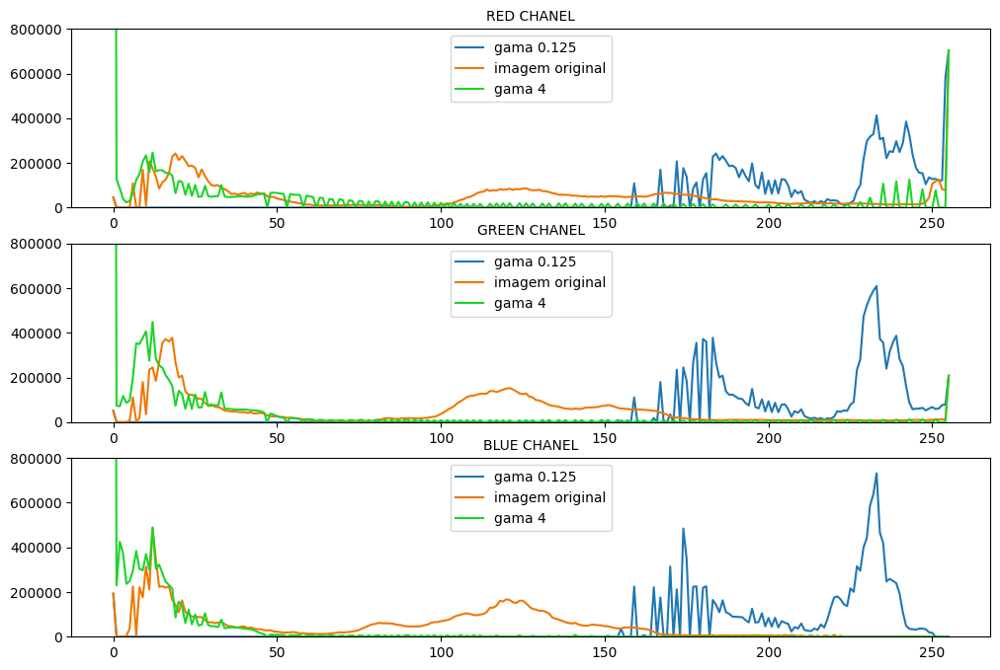

In [ ]:
#histogramas individuais dos canais RGB

hist_chanel1 = cv2.calcHist([splitted[0]],[0],None,[256],[0,256])
plt.figure(figsize= (12,8))

plt.subplot(3,1,1)
plt.ylim(0,8*(10**5))
plt.plot(imgs_corrected[0], label = 'gama 0.125')
plt.plot(hist_chanel1, label = 'imagem original', color = '#f07800')
plt.plot(imgs_corrected[1], label = 'gama 4', color = '#1cd428')
plt.legend(loc='upper center')
plt.title('RED CHANEL', fontsize = 10)

hist_chanel2 = cv2.calcHist([splitted[1]],[0],None,[256],[0,256])
plt.subplot(3,1,2)
plt.ylim(0,8*(10**5))
plt.plot(imgs_corrected[2], label = 'gama 0.125')
plt.plot(hist_chanel2, label = 'imagem original', color = '#f07800')
plt.plot(imgs_corrected[3], label = 'gama 4', color = '#1cd428')
plt.legend(loc='upper center')
plt.title('GREEN CHANEL', fontsize = 10)

hist_chanel3 = cv2.calcHist([splitted[2]],[0],None,[256],[0,256])
plt.subplot(3,1,3)
plt.ylim(0,8*(10**5))
plt.plot(imgs_corrected[4], label = 'gama 0.125')
plt.plot(hist_chanel3, label = 'imagem original', color = '#f07800')
plt.plot(imgs_corrected[5], label = 'gama 4', color = '#1cd428')
plt.legend(loc='upper center')
plt.title('BLUE CHANEL', fontsize = 10)

* Os histogramas dos canais rgb são bastante parecidos, entretanto, há pequenas variações nos picos
* Os deslocamentos são bastante parecidos com o da imagem rgb, porém a região mais a esquerda mostra de forma mais evidente a diferença entre os canais.
  * O histograma do canal R, dispara nessa região com $\gamma = 4$, pois o céu no por do sol concentra muitos tons de vermelho.
  
  * Fica intermediário no canal G, pois há presença de cor amarela -  a qual é formada pela presença de vermelho e verde, sendo seu código rgb igual a (255,255,0).
   
  * E fica próximo de zero no canal B. como é percebido na imagem RGB e denotado nas imagens individuais dos canais.


<Figure size 1200x800 with 0 Axes>

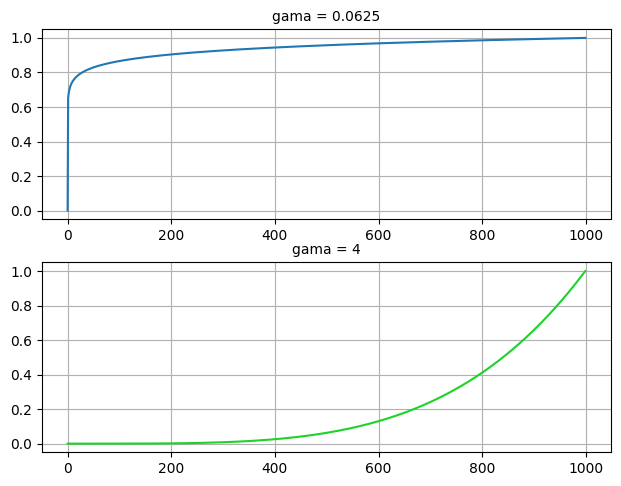

In [ ]:
plt.figure(figsize = (12,8))
fig, axs = plt.subplots(2,1)
fig.tight_layout(pad=1.0)
x = np.linspace(0,1,1000)
gama1 = x**(1/16)
gama2 = x**(4)
axs[0].plot(gama1)
axs[0].grid()
axs[0].set_title('gama = '+str(1/16),fontsize = 10)

axs[1].plot(gama2, color = '#1cd428')
axs[1].grid()
axs[1].set_title('gama = '+str(4), fontsize = 10)


fig.show()

* A visualização das partes claras fica mais facilitada quando $\gamma < 1$, pois a parte clara do histograma tem o contraste estendido.
  * Destaco a parte mais amarelada do por do sol, a qual está contrastando bastante com todo o resto da imagem
* No caso contrário, quando $\gamma > 1$, a recíproca é verdadeira. Isto é, a visualização das partes escuras é facilitada pois seu contraste é estendido
  * Tanto que é possível ver as folhagens das árvores como partes escuras nessa imagem.
* Em ambos os casos, a visualização da imagem como um todo fica comprometida.






# **Questão 2:**

Dada a imagem colorida RecortePorDoSol.tiff, converta-a para tons de cinza. Peque a imagem resultante e aplique a operação de equalização de histograma. Explique esta operação detalhadamente e, em seguida, analise os resultados quanto aos seus efeitos qualitativos nas partes claras e escuras da imagem. Utilize também os gráficos dos histogramas que julgar necessário.

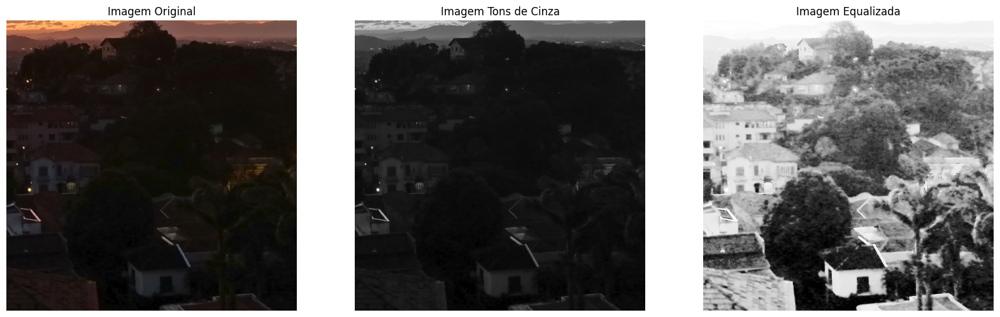

In [ ]:

import cv2
import matplotlib.pyplot as plt
import numpy as np
Original = cv2.imread('RecortePorDoSol.tiff')
grayImg = cv2.cvtColor(Original, cv2.COLOR_BGR2GRAY)
EqualizedImg = cv2.equalizeHist(grayImg)
plt.figure(figsize = (20,20))
plt.subplot(1,3,1)
plt.title('Imagem Original')
plt.axis('off')
plt.imshow(cv2.cvtColor(Original, cv2.COLOR_BGR2RGB))
plt.subplot(1,3,2)
plt.title('Imagem Tons de Cinza')
plt.axis('off')
plt.imshow(grayImg, cmap='gray')
plt.subplot(1,3,3)
plt.title('Imagem Equalizada')
plt.axis('off')
plt.imshow(EqualizedImg,cmap='gray')

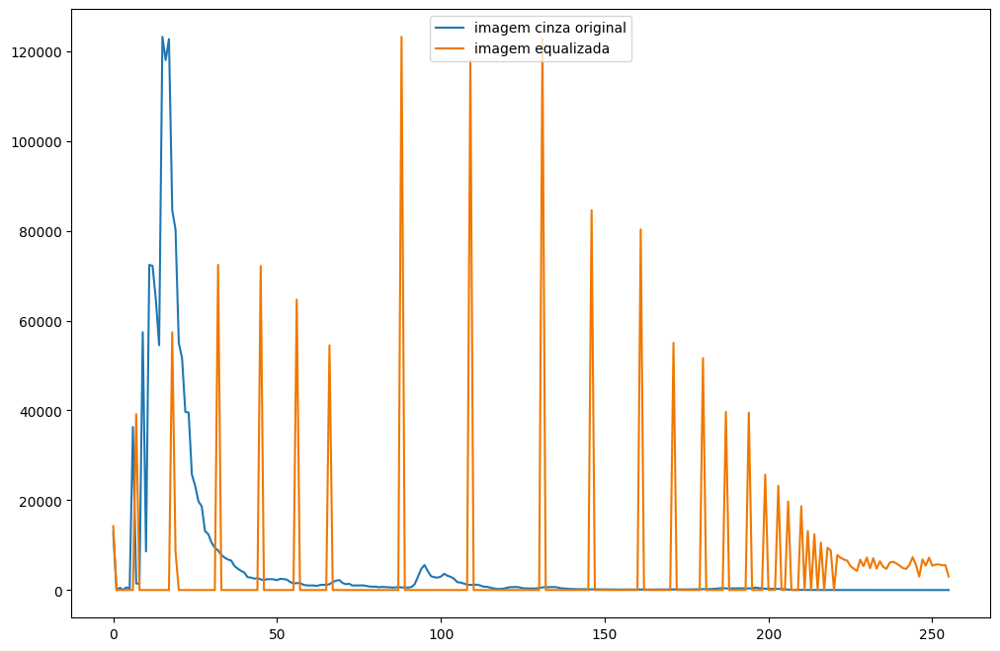

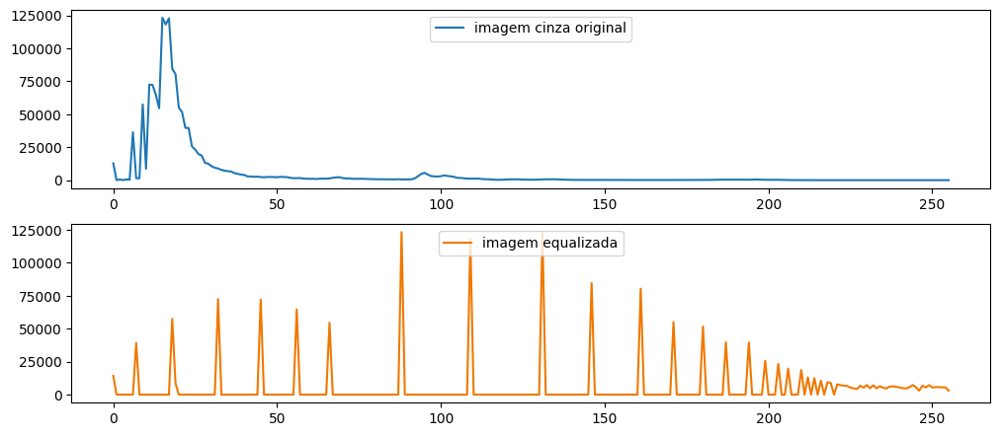

In [ ]:
hist1 = cv2.calcHist([grayImg],[0],None,[256],[0,256])
hist2 = cv2.calcHist([EqualizedImg],[0],None,[256],[0,256])

plt.figure(figsize= (12,8))
plt.plot(hist1, label = 'imagem cinza original')
plt.plot(hist2, label = 'imagem equalizada', color = '#f07800')
plt.legend(loc='upper center')

plt.figure(num = 123,figsize = (12,8))
plt.subplot(3,1,1)
plt.plot(hist1, label = 'imagem cinza original')
plt.legend(loc='upper center')

plt.subplot(3,1,2)
plt.plot(hist2, label = 'imagem equalizada', color = '#f07800')
plt.legend(loc='upper center')

### 1. Sobre a Equalização e Análise Qualitativa
  * No processo de equalização, há uma distribuição mais uniforme dos níveis de intensidade, seja por meio da expansão - alargamento - da faixa ocupada pelo histograma, seja pela maior distribuição dos níveis.
  
    * Como pode ser observado nos gráficos acima, os pícos foram alargados, de modo a ocupar toda a área do gráfico, como que "esticados".

    * No caso dessa imagem, os níveis estavam concentrados praticamente no lado esquerdo, dessa forma escurecendo a imagem. Após a equalização, os níveis foram distribuídos de forma uniforme, apresentando vales e picos mais bem distruídos ao longo de todos os níveis de intensidade.

  *  Dessa forma, os extremos das imagens equalizadas são amenizados. O que, por sua vez, promove um contraste maior entre os elementos da imagem, permitindo uma melhor diferenciação desses -  como pode ser observado nas árvores do canto direito superior, as quais não estavam bem definidas, se assemelhando há um borrão escuro. após a equalização, foi possível diferenciá-las pelos contornos das suas copas. Por outro lado, os elementos do céu perderam o contraste.
    * Essa situação pode ser explicada pois possuíam um contraste muito próximo, dessa forma, a uniformização aproximou os níveis de intensidade dessses elementos, dificultando sua diferenciação.

